# Aadhaar Biometric Enrollment System Stress Analysis
## UIDAI Data Intelligence Hackathon Submission

### 1.1 Problem Definition
Aadhaar biometric enrollment systems face unprecedented operational pressure due to:
* **Age cohort imbalances** between child (5-17) and adult (17+) enrollments
* **Geographic data quality** issues (pincodes spanning multiple districts)
* **Temporal volatility** in enrollment patterns across regions
* **Future capacity constraints** driven by unbalanced demographic distribution

Current administrative frameworks lack predictive intelligence to identify which districts will face service degradation due to revalidation backlogs and infrastructure strain.

### 1.2 Analytical Approach
This analysis employs **information-theoretic and dynamical systems frameworks** to transform static enrollment counts into actionable early-warning signals:

1. **Univariate Intelligence:** Compute age-imbalance metrics (CTAR, FBLI) and information entropy
2. **Temporal Dynamics:** Apply discrete calculus (derivatives, acceleration) to detect systemic shifts
3. **Multi-Signal Validation:** Cross-validate findings using z-score normalization and signal agreement thresholds
4. **Null Hypothesis Testing:** Prove observed patterns are non-random structural artifacts


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
%matplotlib inline

In [2]:
df1=pd.read_csv('api_data_aadhar_biometric_0_500000.csv')
df2=pd.read_csv('api_data_aadhar_biometric_500000_1000000.csv')
df3=pd.read_csv('api_data_aadhar_biometric_1000000_1500000.csv')
df4=pd.read_csv('api_data_aadhar_biometric_1500000_1861108.csv')

In [3]:
df=pd.concat([df1,df2,df3,df4],ignore_index=True)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1861108 entries, 0 to 1861107
Data columns (total 6 columns):
 #   Column        Dtype 
---  ------        ----- 
 0   date          object
 1   state         object
 2   district      object
 3   pincode       int64 
 4   bio_age_5_17  int64 
 5   bio_age_17_   int64 
dtypes: int64(3), object(3)
memory usage: 85.2+ MB


In [5]:
df['date'].astype('str').value_counts()
df['date_raw']=df['date'].astype('str').str.strip()
df['date_parsed'] = pd.to_datetime(df['date_raw'], format='%d-%m-%Y', errors='coerce')
df['date_parsed'].head()

0   2025-03-01
1   2025-03-01
2   2025-03-01
3   2025-03-01
4   2025-03-01
Name: date_parsed, dtype: datetime64[ns]

In [6]:
df['date_parsed'] = df['date_parsed'].fillna(pd.to_datetime(df['date_raw'], format='%d/%m/%Y', errors='coerce'))
df['date_parsed']=df['date_parsed'].fillna(pd.to_datetime(df['date_raw'], format='%Y', errors='coerce'))

In [7]:
loss_rate = df['date_parsed'].isna().mean()
loss_rate


0.0

In [8]:
df = df.dropna(subset=['date_parsed'])
df['date'] = df['date_parsed']
df = df.drop(columns=['date_raw', 'date_parsed'])
df.shape

(1861108, 6)

In [9]:
def clean_state_name(x):
    if pd.isna(x):
        return x
    x = str(x).lower()
    x = re.sub(r'[^a-z\s]', ' ', x)   # remove symbols like &, .
    x = re.sub(r'\s+', ' ', x).strip()  # remove extra spaces
    return x


In [10]:
state_mapping = {
    # West Bengal
    'west bengal': 'West Bengal',
    'west bangal': 'West Bengal',
    'westbengal':  'West Bengal',
    'west  bengal':'West Bengal',
    'westbengal ': 'West Bengal',

    # Andhra Pradesh
    'andhra pradesh': 'Andhra Pradesh',

    # Odisha
    'odisha': 'Odisha',
    'orissa': 'Odisha',

    # Jammu & Kashmir
    'jammu and kashmir': 'Jammu and Kashmir',
    'jammu kashmir': 'Jammu and Kashmir',

    # Collapse all Dadra / Daman variants into ONE state
    'dadra nagar haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'dadra and nagar haveli': 'Dadra and Nagar Haveli and Daman and Diu',
    'daman and diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'dadra and nagar haveli and daman and diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'the dadra and nagar haveli and daman and diu': 'Dadra and Nagar Haveli and Daman and Diu',
    'daman diu': 'Dadra and Nagar Haveli and Daman and Diu',


    # Puducherry
    'puducherry': 'Puducherry',


    # Andaman & Nicobar Islands
    'andaman and nicobar islands': 'Andaman and Nicobar Islands',
    'andaman nicobar islands': 'Andaman and Nicobar Islands',

    # Puducherry
    'pondicherry': 'Puducherry',

    # Case-normalized direct matches
    'delhi': 'Delhi',
    'ladakh': 'Ladakh',
    'goa': 'Goa',
    'sikkim': 'Sikkim',
    'assam': 'Assam',
    'bihar': 'Bihar',
    'punjab': 'Punjab',
    'kerala': 'Kerala',
    'haryana': 'Haryana',
    'gujarat': 'Gujarat',
    'tamil nadu': 'Tamil Nadu',
    'Tamilnadu' : 'Tamil Nadu',
    'telangana': 'Telangana',
    'karnataka': 'Karnataka',
    'maharashtra': 'Maharashtra',
    'rajasthan': 'Rajasthan',
    'uttar pradesh': 'Uttar Pradesh',
    'madhya pradesh': 'Madhya Pradesh',
    'himachal pradesh': 'Himachal Pradesh',
    'arunachal pradesh': 'Arunachal Pradesh',
    'chhattisgarh': 'Chhattisgarh',
    'Chhatisgarh':  'Chhattisgarh',
    'jharkhand': 'Jharkhand',
    'manipur': 'Manipur',
    'meghalaya': 'Meghalaya',
    'mizoram': 'Mizoram',
    'nagaland': 'Nagaland',
    'tripura': 'Tripura',
    'uttarakhand': 'Uttarakhand',
    'Uttaranchal': 'Uttarakhand',
    'lakshadweep': 'Lakshadweep',
    'chandigarh': 'Chandigarh'
}


In [11]:
df['state'] = df['state'].replace('Uttaranchal', 'Uttarakhand')
df['state'] = df['state'].replace('Chhatisgarh', 'Chhattisgarh')
df['state'] = df['state'].replace('Tamilnadu', 'Tamil Nadu')

In [12]:
df['state_clean'] = (
    df['state']
    .apply(clean_state_name)
    .map(state_mapping)
)
df['state_clean'].count()

1861108

In [13]:
# Drop invalid entries like numeric junk
df = df[~df['state'].astype(str).str.isnumeric()]

# Optional: check unmapped states
unmapped = df[df['state_clean'].isna()]['state'].unique()
print("Unmapped values:", unmapped)


Unmapped values: []


In [14]:
df['state_clean'].unique()

array(['Haryana', 'Bihar', 'Jammu and Kashmir', 'Tamil Nadu',
       'Maharashtra', 'Gujarat', 'Odisha', 'West Bengal', 'Kerala',
       'Rajasthan', 'Punjab', 'Himachal Pradesh', 'Uttar Pradesh',
       'Assam', 'Uttarakhand', 'Madhya Pradesh', 'Karnataka',
       'Andhra Pradesh', 'Telangana', 'Goa', 'Nagaland', 'Jharkhand',
       'Delhi', 'Chhattisgarh', 'Meghalaya', 'Chandigarh', 'Puducherry',
       'Manipur', 'Sikkim', 'Tripura', 'Mizoram', 'Arunachal Pradesh',
       'Ladakh', 'Dadra and Nagar Haveli and Daman and Diu',
       'Andaman and Nicobar Islands', 'Lakshadweep'], dtype=object)

In [22]:
df['state_clean'].nunique()

36

In [23]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'state_clean', 'total_enrolled', 'pin_multi_state_flag'],
      dtype='object')

In [24]:
df.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,state_clean,total_enrolled,pin_multi_state_flag
0,2025-03-01,Haryana,Mahendragarh,123029,280,577,Haryana,857,False
1,2025-03-01,Bihar,Madhepura,852121,144,369,Bihar,513,False
2,2025-03-01,Jammu and Kashmir,Punch,185101,643,1091,Jammu and Kashmir,1734,False
3,2025-03-01,Bihar,Bhojpur,802158,256,980,Bihar,1236,False
4,2025-03-01,Tamil Nadu,Madurai,625514,271,815,Tamil Nadu,1086,False


In [25]:
df['total_enrolled']=df['bio_age_5_17'] +df['bio_age_17_']
df.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,state_clean,total_enrolled,pin_multi_state_flag
0,2025-03-01,Haryana,Mahendragarh,123029,280,577,Haryana,857,False
1,2025-03-01,Bihar,Madhepura,852121,144,369,Bihar,513,False
2,2025-03-01,Jammu and Kashmir,Punch,185101,643,1091,Jammu and Kashmir,1734,False
3,2025-03-01,Bihar,Bhojpur,802158,256,980,Bihar,1236,False
4,2025-03-01,Tamil Nadu,Madurai,625514,271,815,Tamil Nadu,1086,False


In [26]:
df_st_enrolled=df.groupby('state_clean')['total_enrolled'].sum().reset_index()
df_st_enrolled=df_st_enrolled.sort_values(by='total_enrolled',ascending=False)
df_st_enrolled.head()

,state_clean,total_enrolled
33,Uttar Pradesh,9577735
20,Maharashtra,9226139
19,Madhya Pradesh,5923771
4,Bihar,4897587
30,Tamil Nadu,4698118


In [27]:
df['pin_multi_state_flag'] = (
    df.groupby('district')['state_clean']
      .transform('nunique') > 1
)
pin_state_map = (
    df[df['pin_multi_state_flag']]
    .groupby('district')['state_clean']
    .unique()
    .reset_index()
)

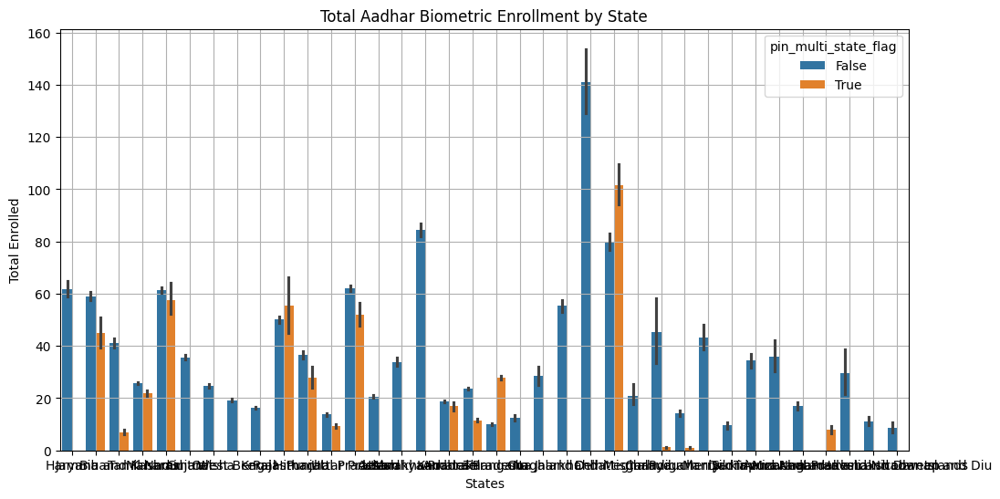

In [28]:
# sns.set_style('whitegrid')
plt.figure(figsize=(12,6))
sns.barplot(x='state_clean',y='total_enrolled',hue='pin_multi_state_flag',data=df)
plt.grid()
plt.xlabel('States')
plt.ylabel('Total Enrolled')
plt.title('Total Aadhar Biometric Enrollment by State')
plt.show()

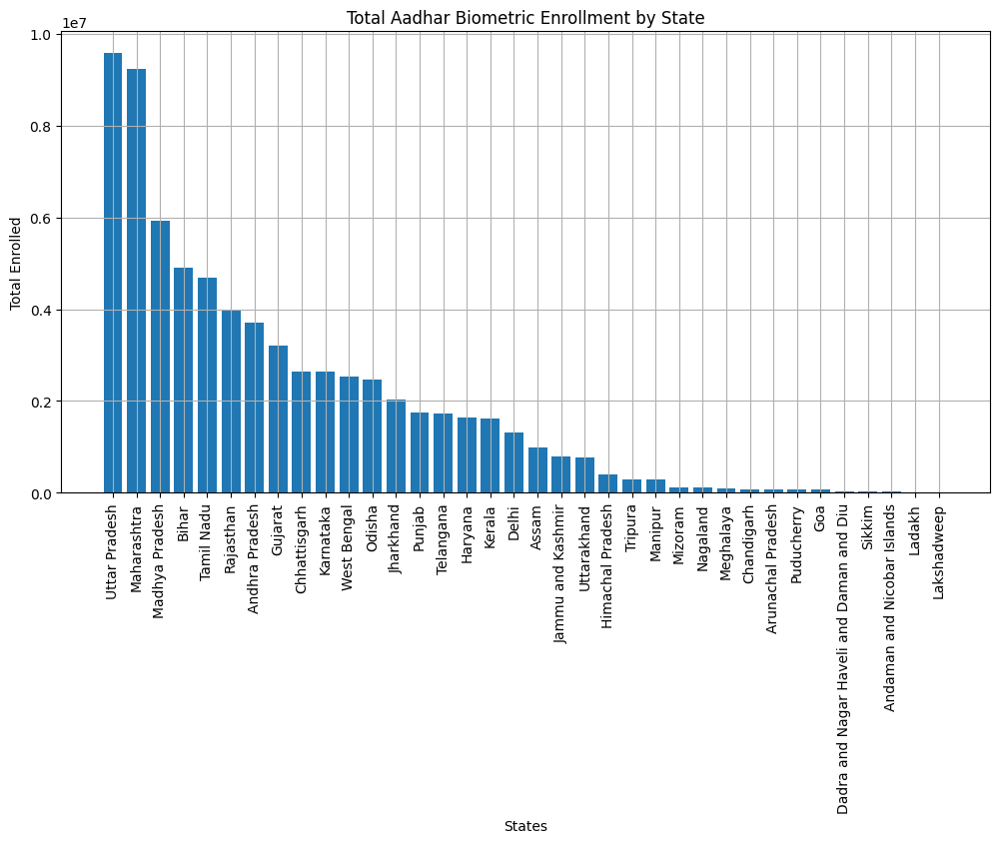

In [29]:
plt.figure(figsize=(12,6))
plt.bar(df_st_enrolled['state_clean'],df_st_enrolled['total_enrolled'])
plt.xticks(rotation=90)
plt.grid()
plt.xlabel('States')
plt.ylabel('Total Enrolled')
plt.title('Total Aadhar Biometric Enrollment by State')
plt.show()

In [30]:
df_state_date = df.groupby(['state_clean', 'date']).size().reset_index(name='count')
df_state_date.head()

,state_clean,date,count
0,Andaman and Nicobar Islands,2025-03-01,22
1,Andaman and Nicobar Islands,2025-04-01,22
2,Andaman and Nicobar Islands,2025-05-01,21
3,Andaman and Nicobar Islands,2025-06-01,18
4,Andaman and Nicobar Islands,2025-07-01,19


In [31]:
df_state=df_state_date.groupby('state_clean')['count'].sum().reset_index()
df_state=df_state.sort_values(by='count',ascending=False)
df_state.head()

,state_clean,count
30,Tamil Nadu,184569
1,Andhra Pradesh,172065
33,Uttar Pradesh,155242
20,Maharashtra,151104
15,Karnataka,141227


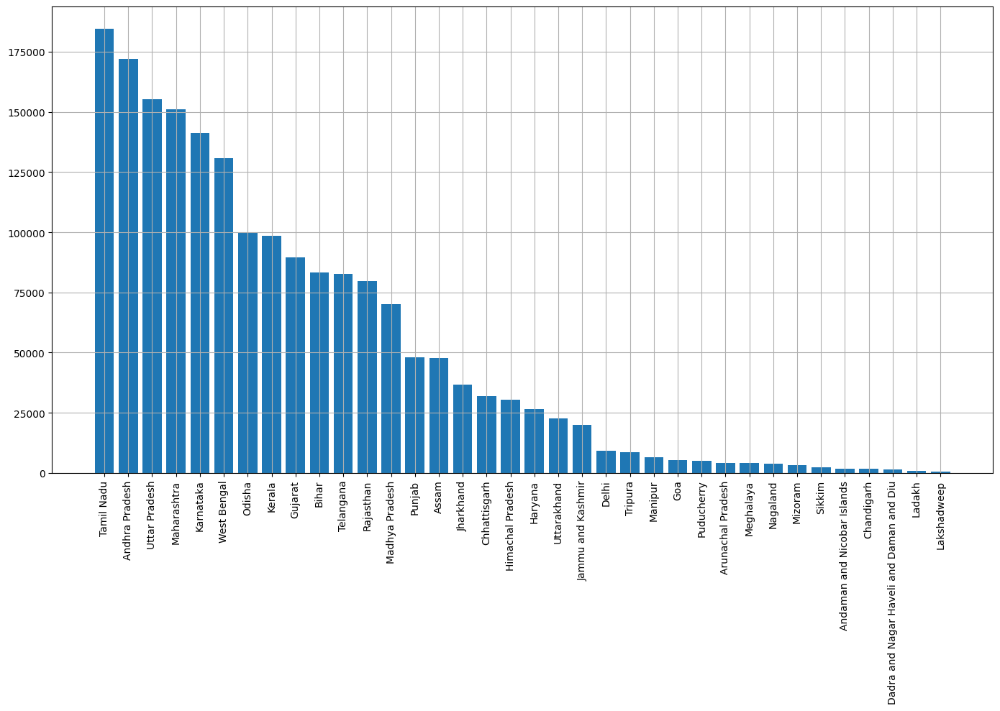

In [32]:
plt.figure(figsize=(14, 10))
plt.bar(df_state['state_clean'],df_state['count'])
plt.xticks(rotation=90)
plt.grid()
plt.tight_layout()
# plt.gca().invert_yaxis()
plt.show()

In [33]:
# Imbalance
df['CTAR']=df['bio_age_17_']/df['total_enrolled'].replace(0,np.nan)
# Imbalance
df['log_CTAR']=np.log(df['CTAR'].replace(0,np.nan))

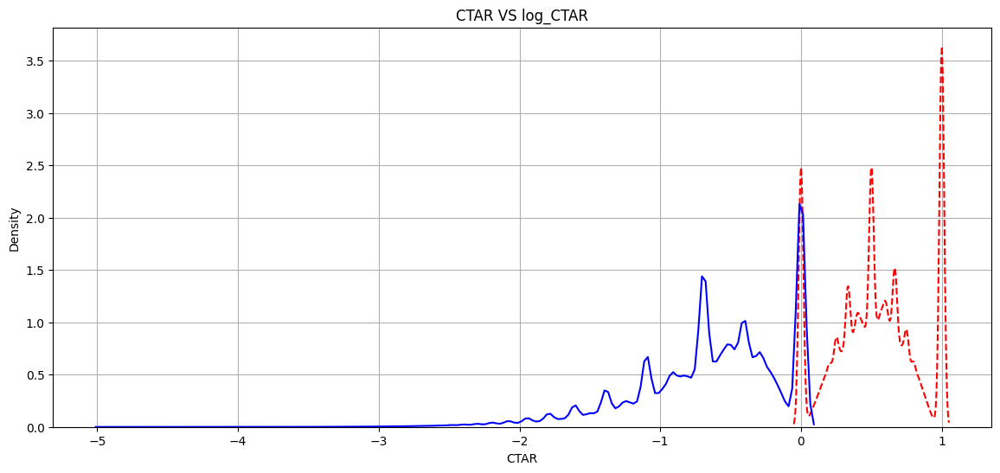

In [34]:
plt.figure(figsize=(14, 6))
sns.kdeplot(x='CTAR',data=df,ls='--',color='red',label='CTAR')
sns.kdeplot(x='log_CTAR',data=df,color='blue',label='log_CTAR')
plt.grid()
plt.title('CTAR VS log_CTAR')
plt.show()

In [35]:
df['year']=df['date'].dt.year
df['month']=df['date'].dt.month
df['day']=df['date'].dt.day
df.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'state_clean', 'total_enrolled', 'pin_multi_state_flag', 'CTAR',
       'log_CTAR', 'year', 'month', 'day'],
      dtype='object')

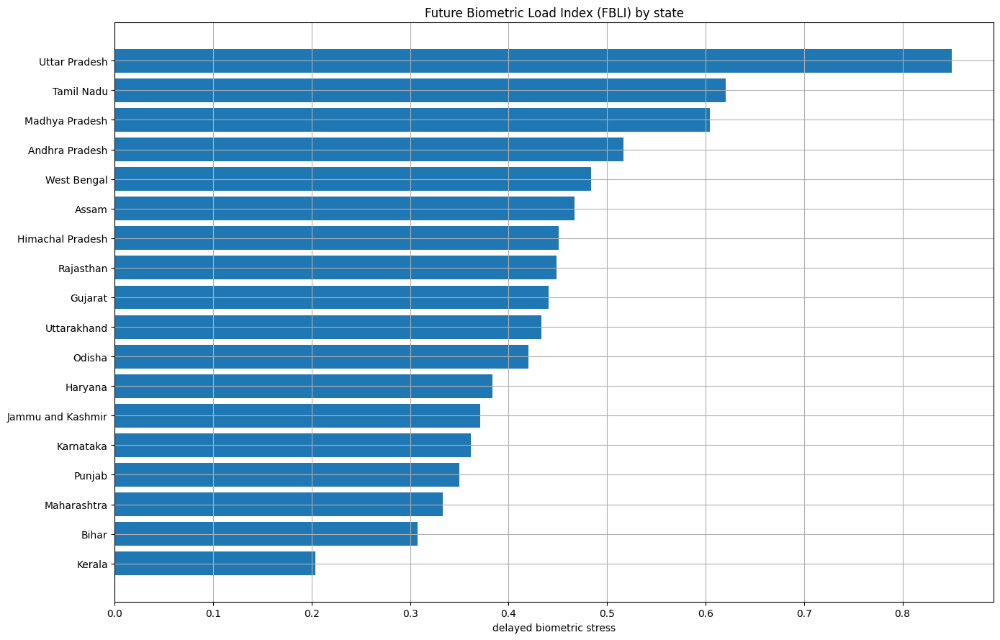

In [38]:
#Future Biometric Load Index (FBLI), delayed biometric stress
df['FBLI']=df['bio_age_5_17']/df['total_enrolled']
top = df.head(36).sort_values('FBLI',ascending=False)

plt.figure(figsize=(14, 9))
plt.barh(top['state_clean'], top['FBLI'])
plt.xlabel("delayed biometric stress")
plt.title("Future Biometric Load Index (FBLI) by state")
plt.grid()
plt.tight_layout()
plt.gca().invert_yaxis()
plt.show()

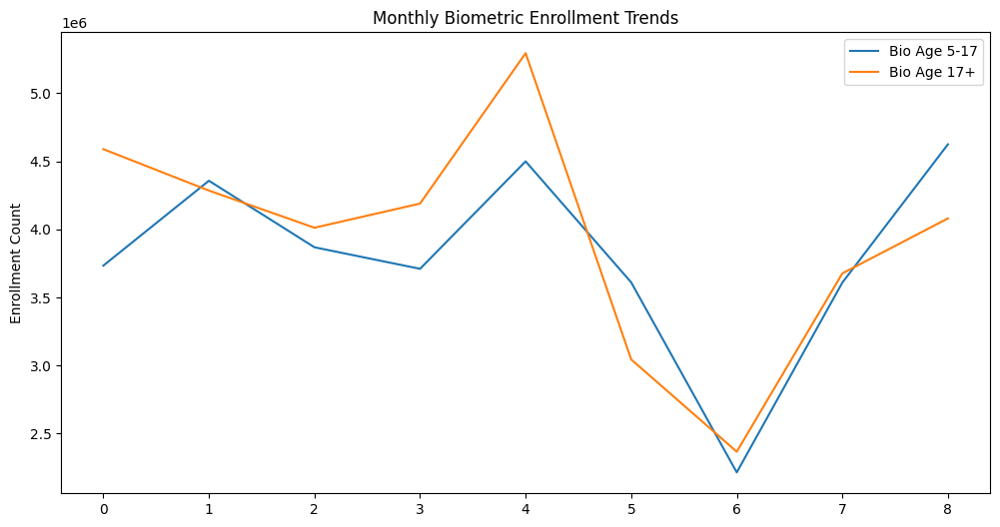

In [39]:
monthly_summary=df.groupby(['year','month'])[['bio_age_5_17','bio_age_17_']].sum().reset_index()
plt.figure(figsize=(12,6))
plt.plot(monthly_summary.index, monthly_summary['bio_age_5_17'], label='Bio Age 5-17')
plt.plot(monthly_summary.index, monthly_summary['bio_age_17_'], label='Bio Age 17+')

plt.ylabel('Enrollment Count')
plt.title('Monthly Biometric Enrollment Trends')
plt.legend()
plt.show()

In [40]:
def shannon_entropy(row):
    total= row['total_enrolled']
    if total == 0:
        return np.nan
    p1 = row['bio_age_5_17'] / total
    p2 = row['bio_age_17_'] / total
    probs=np.array([p1,p2])
    probs=probs[probs>0]
    return -np.sum(probs*np.log(probs))

df['age_entropy'] = df.apply(shannon_entropy, axis=1)

In [41]:
district_metrics = df.groupby('state_clean')[['CTAR', 'FBLI']].mean().reset_index()

district_metrics.sort_values('CTAR', ascending=False).head(10)
district_metrics.sort_values('FBLI', ascending=False).head(10)

# print("Top CTAR districts represent future biometric overload zones.")

,state_clean,CTAR,FBLI
2,Arunachal Pradesh,0.355526,0.644474
23,Mizoram,0.390824,0.609176
33,Uttar Pradesh,0.397360,0.602640
21,Manipur,0.407712,0.592288
3,Assam,0.408121,0.591879
31,Telangana,0.410342,0.589658
17,Ladakh,0.438823,0.561177
13,Jammu and Kashmir,0.439641,0.560359
34,Uttarakhand,0.450201,0.549799
9,Goa,0.454101,0.545899


In [42]:
df['d_child_dt']=df.groupby('district')['bio_age_5_17'].diff()
df['d_adult_dt']=df.groupby('district')['bio_age_17_'].diff()
df['dd_child_dt2']=df.groupby('district')['d_child_dt'].diff()
df['dd_adult_dt2']=df.groupby('district')['d_adult_dt'].diff()

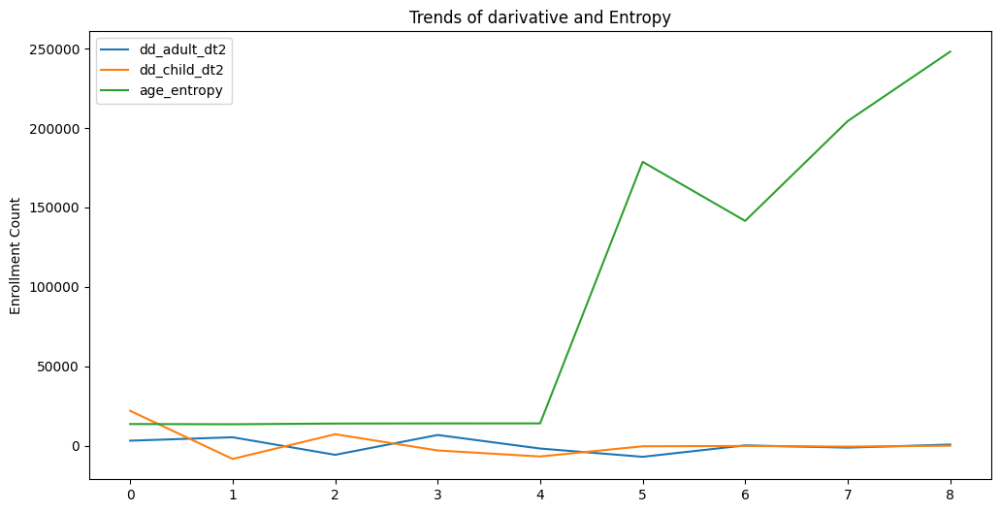

In [43]:

monthly_summary=df.groupby(['year','month'])[['d_child_dt','dd_child_dt2','age_entropy','d_adult_dt','dd_adult_dt2']].sum().reset_index()
plt.figure(figsize=(12,6))
plt.plot(monthly_summary.index, monthly_summary['dd_adult_dt2'], label='dd_adult_dt2')
plt.plot(monthly_summary.index, monthly_summary['dd_child_dt2'], label='dd_child_dt2')
plt.plot(monthly_summary.index, monthly_summary['age_entropy'], label='age_entropy')

plt.ylabel('Enrollment Count')
plt.title('Trends of darivative and Entropy')
plt.legend()
plt.show()


In [44]:
df.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'state_clean', 'total_enrolled', 'pin_multi_state_flag', 'CTAR',
       'log_CTAR', 'year', 'month', 'day', 'FBLI', 'age_entropy', 'd_child_dt',
       'd_adult_dt', 'dd_child_dt2', 'dd_adult_dt2'],
      dtype='object')

In [45]:
df_up=df[df['state_clean']=='Uttar Pradesh']
df_up.shape

(155242, 20)

In [46]:
df_up['district_clean'] = (
    df['district']
    .apply(clean_state_name)
)
df_up['district_clean'].count()

/tmp/ipykernel_14648/2971465794.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['district_clean'] = (


155242

In [47]:
print(f'df_up[\'district_clean\'].unique(): \n {df_up["district_clean"].unique()}\n\n')
print(f'df_up[\'district_clean\'].nunique(): {df_up["district_clean"].nunique()}')

df_up['district_clean'].unique(): 
 ['bara banki' 'hardoi' 'siddharthnagar' 'ballia' 'lucknow' 'bahraich'
 'basti' 'allahabad' 'unnao' 'budaun' 'kanpur dehat' 'aligarh' 'meerut'
 'kushinagar' 'gorakhpur' 'faizabad' 'varanasi' 'chandauli' 'kanpur nagar'
 'sonbhadra' 'rampur' 'kannauj' 'azamgarh' 'ambedkar nagar' 'moradabad'
 'chitrakoot' 'auraiya' 'banda' 'sant ravidas nagar' 'mathura' 'agra'
 'muzaffarnagar' 'bulandshahr' 'pilibhit' 'kheri' 'jalaun'
 'sant kabir nagar' 'jaunpur' 'mainpuri' 'deoria' 'ayodhya' 'kaushambi'
 'etawah' 'jhansi' 'fatehpur' 'shamli' 'ghaziabad' 'saharanpur'
 'rae bareli' 'bareilly' 'balrampur' 'shahjahanpur' 'hamirpur' 'hathras'
 'pratapgarh' 'gonda' 'mau' 'baghpat' 'sitapur' 'ghazipur' 'bijnor'
 'mirzapur' 'amroha' 'sambhal' 'amethi' 'hapur' 'prayagraj' 'farrukhabad'
 'bhadohi' 'firozabad' 'gautam buddha nagar' 'kasganj' 'sultanpur'
 'barabanki' 'shrawasti' 'etah' 'lalitpur' 'maharajganj' 'mahoba'
 'sant ravidas nagar bhadohi' 'bulandshahar' 'jyotiba phule na

In [48]:
df_up.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,state_clean,total_enrolled,pin_multi_state_flag,CTAR,...,year,month,day,FBLI,age_entropy,d_child_dt,d_adult_dt,dd_child_dt2,dd_adult_dt2,district_clean
21,2025-03-01,Uttar Pradesh,Bara Banki,225408,17,3,Uttar Pradesh,20,False,0.150000,...,2025,3,1,0.850000,0.422709,NaN,NaN,NaN,NaN,bara banki
69,2025-03-01,Uttar Pradesh,Hardoi,241406,803,216,Uttar Pradesh,1019,False,0.211973,...,2025,3,1,0.788027,0.516558,NaN,NaN,NaN,NaN,hardoi
70,2025-03-01,Uttar Pradesh,Siddharthnagar,272205,857,272,Uttar Pradesh,1129,False,0.240921,...,2025,3,1,0.759079,0.552139,NaN,NaN,NaN,NaN,siddharthnagar
75,2025-03-01,Uttar Pradesh,Hardoi,241304,1025,328,Uttar Pradesh,1353,False,0.242424,...,2025,3,1,0.757576,0.553858,222.0,112.0,NaN,NaN,hardoi
138,2025-03-01,Uttar Pradesh,Ballia,277209,293,185,Uttar Pradesh,478,False,0.387029,...,2025,3,1,0.612971,0.667401,NaN,NaN,NaN,NaN,ballia


In [49]:
df_up.info()

<class 'pandas.core.frame.DataFrame'>
Index: 155242 entries, 21 to 1860718
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   date                  155242 non-null  datetime64[ns]
 1   state                 155242 non-null  object        
 2   district              155242 non-null  object        
 3   pincode               155242 non-null  int64         
 4   bio_age_5_17          155242 non-null  int64         
 5   bio_age_17_           155242 non-null  int64         
 6   state_clean           155242 non-null  object        
 7   total_enrolled        155242 non-null  int64         
 8   pin_multi_state_flag  155242 non-null  bool          
 9   CTAR                  155240 non-null  float64       
 10  log_CTAR              143652 non-null  float64       
 11  year                  155242 non-null  int32         
 12  month                 155242 non-null  int32         
 13  da

In [50]:
df_up[df_up['district']=='Bara Banki']['pincode'].unique()

array([225408, 225206, 227301, 225304, 225303, 225413, 225125, 227302,
       227131, 225119, 225409, 225202, 225405, 225403, 225121, 225416,
       225123, 225203, 225204, 225412, 225120, 225414, 225122, 225301,
       225207, 225201, 225302, 225305, 225401, 225415, 225306, 225205,
       225001, 225404, 225003, 225124, 225208, 225126, 225002, 225402,
       225406])

In [51]:
df_up[df_up['district']=='Bara Banki']['pincode'].nunique()

41

In [52]:
df_up.describe()

,date,pincode,bio_age_5_17,bio_age_17_,total_enrolled,CTAR,log_CTAR,year,month,day,FBLI,age_entropy,d_child_dt,d_adult_dt,dd_child_dt2,dd_adult_dt2
count,155242,155242.000000,155242.000000,155242.000000,155242.000000,155240.000000,143652.000000,155242.0,155242.000000,155242.000000,155240.000000,155240.000000,155155.000000,155155.000000,155068.000000,155068.000000
mean,2025-10-21 16:31:53.605854208,237920.508464,39.983413,21.712101,61.695514,0.397360,-0.975333,2025.0,10.273946,13.108972,0.602640,0.528600,-0.079869,-0.144636,0.155035,-0.039550
min,2025-03-01 00:00:00,121705.000000,0.000000,0.000000,0.000000,0.000000,-4.343805,2025.0,3.000000,1.000000,0.000000,-0.000000,-7541.000000,-4905.000000,-14608.000000,-9845.000000
25%,2025-09-17 00:00:00,212641.000000,4.000000,2.000000,6.000000,0.250000,-1.276327,2025.0,9.000000,6.000000,0.500000,0.500402,-9.000000,-5.000000,-14.000000,-8.000000
50%,2025-11-02 00:00:00,229802.000000,11.000000,6.000000,18.000000,0.375000,-0.928496,2025.0,11.000000,13.000000,0.625000,0.636514,0.000000,0.000000,2.000000,1.000000
75%,2025-12-02 00:00:00,271001.000000,25.000000,14.000000,39.000000,0.500000,-0.663294,2025.0,12.000000,19.000000,0.750000,0.679193,9.000000,5.000000,20.000000,11.000000
max,2025-12-29 00:00:00,285223.000000,8002.000000,4980.000000,11612.000000,1.000000,0.000000,2025.0,12.000000,31.000000,1.000000,0.693147,7067.000000,4940.000000,7397.000000,5437.000000
std,NaN,26482.112696,153.393263,82.076029,228.365655,0.237257,0.531296,0.0,1.756932,8.595609,0.237257,0.227157,157.755493,88.595133,272.208334,152.619036


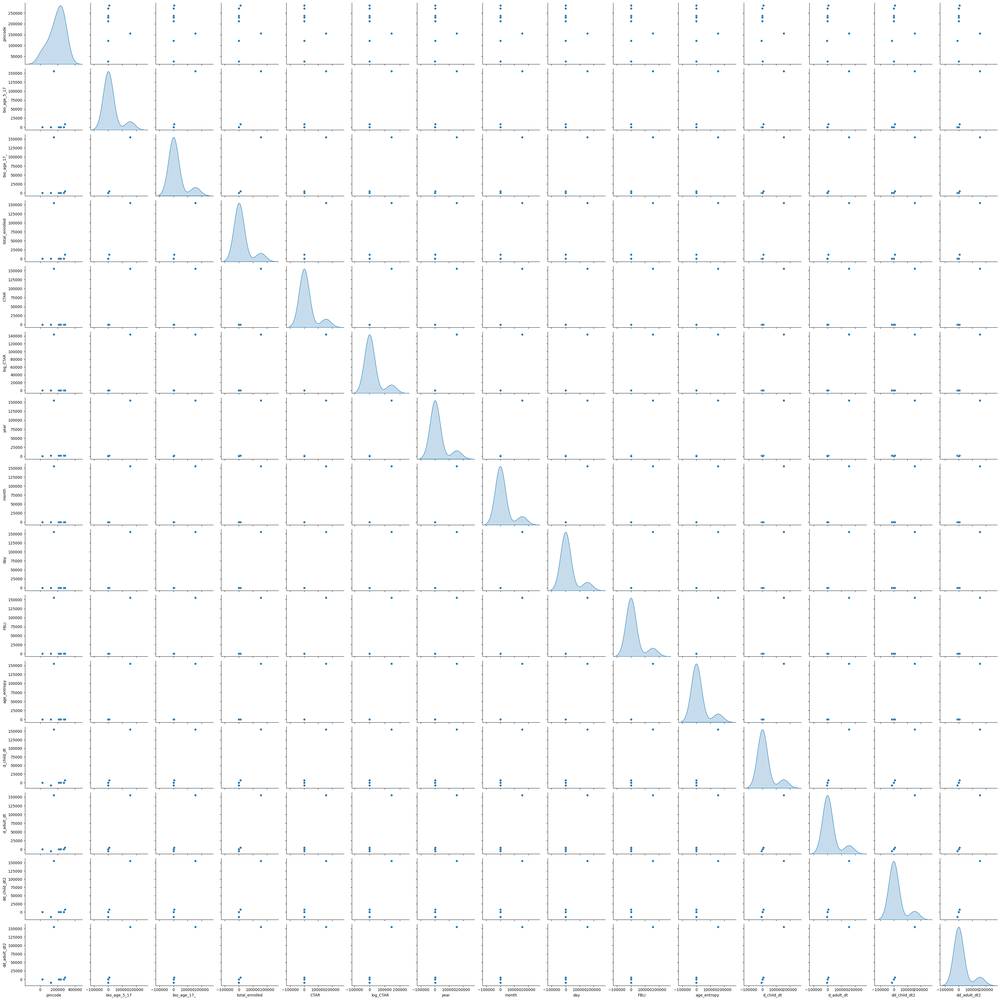

In [53]:
sns.pairplot(df_up.describe(),diag_kind='kde')

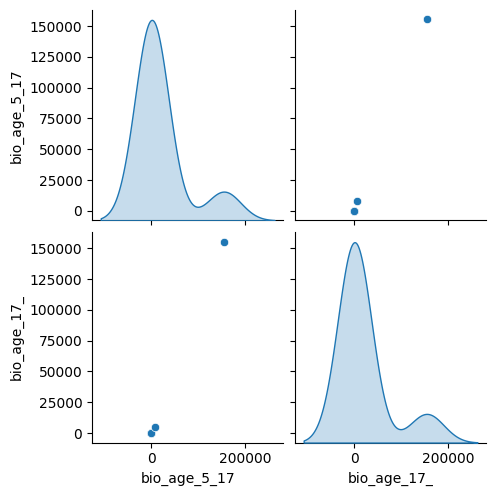

In [54]:
sns.pairplot(df_up[['bio_age_5_17','bio_age_17_']].describe(),diag_kind='kde')

In [55]:
pin_district_count = (
    df_up.groupby('pincode')['district']
      .nunique()
      .reset_index(name='district_count')
)
pin_district_count


,pincode,district_count
0,121705,2
1,201001,2
2,201002,2
3,201003,1
4,201004,1
...,...,...
1748,285203,1
1749,285204,1
1750,285205,2
1751,285206,1


In [56]:
warning_pins=pin_district_count[
    pin_district_count['district_count'] >1
]
warning_pins

,pincode,district_count
0,121705,2
1,201001,2
2,201002,2
5,201005,2
6,201006,2
...,...,...
1731,284405,2
1740,285125,2
1741,285126,2
1750,285205,2


In [57]:
pin_district_count[pin_district_count['district_count'] >1]['district_count'].value_counts()

district_count
2    460
3     77
4      5
Name: count, dtype: int64

In [58]:
df_flagged =df_up.merge(
    warning_pins[['pincode']],
    on='pincode',
    how='inner'
)

In [59]:
df_flagged.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_,state_clean,total_enrolled,pin_multi_state_flag,CTAR,...,year,month,day,FBLI,age_entropy,d_child_dt,d_adult_dt,dd_child_dt2,dd_adult_dt2,district_clean
0,2025-03-01,Uttar Pradesh,Bara Banki,225408,17,3,Uttar Pradesh,20,False,0.150000,...,2025,3,1,0.850000,0.422709,NaN,NaN,NaN,NaN,bara banki
1,2025-03-01,Uttar Pradesh,Bara Banki,225206,259,117,Uttar Pradesh,376,False,0.311170,...,2025,3,1,0.688830,0.620034,242.0,114.0,NaN,NaN,bara banki
2,2025-03-01,Uttar Pradesh,Siddharthnagar,272153,1457,670,Uttar Pradesh,2127,False,0.314998,...,2025,3,1,0.685002,0.623041,600.0,398.0,NaN,NaN,siddharthnagar
3,2025-03-01,Uttar Pradesh,Bahraich,271803,107,36,Uttar Pradesh,143,False,0.251748,...,2025,3,1,0.748252,0.564248,NaN,NaN,NaN,NaN,bahraich
4,2025-03-01,Uttar Pradesh,Basti,272177,40,45,Uttar Pradesh,85,False,0.529412,...,2025,3,1,0.470588,0.691416,NaN,NaN,NaN,NaN,basti


In [60]:
flag_pin_dominant=df_flagged.groupby(['district', 'pincode'])[['bio_age_5_17','bio_age_17_']].sum().reset_index()

In [61]:
flag_pin_dominant['total_enroll'] =flag_pin_dominant['bio_age_5_17']+flag_pin_dominant['bio_age_17_']

In [62]:
flag_pin_dominant.head()

,district,pincode,bio_age_5_17,bio_age_17_,total_enroll
0,Agra,202412,1,0,1
1,Agra,209401,2,0,2
2,Agra,209821,2,1,3
3,Agra,212641,1,0,1
4,Agra,212653,1,0,1


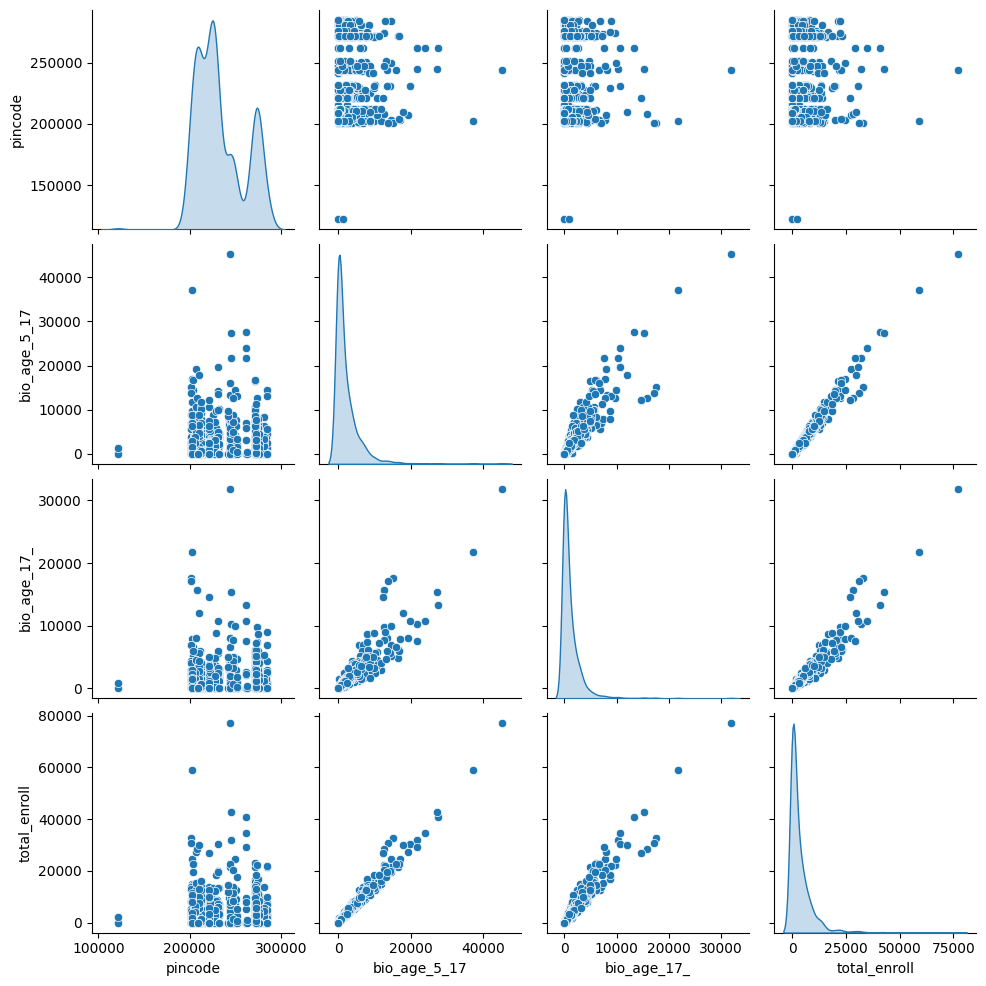

In [63]:
sns.pairplot(flag_pin_dominant,diag_kind='kde')

In [64]:
idx = flag_pin_dominant.groupby('pincode')['total_enroll'].idxmax()
df_filtered = flag_pin_dominant.loc[idx]
df_filtered


,district,pincode,bio_age_5_17,bio_age_17_,total_enroll
838,Mau,121705,1331,858,2189
566,Ghaziabad,201001,15131,17559,32690
567,Ghaziabad,201002,3861,4291,8152
568,Ghaziabad,201005,5730,6858,12588
569,Ghaziabad,201006,1082,1219,2301
...,...,...,...,...,...
781,Lalitpur,284405,5696,4330,10026
667,Jalaun,285125,2225,1057,3282
668,Jalaun,285126,1247,729,1976
669,Jalaun,285205,4847,2846,7693


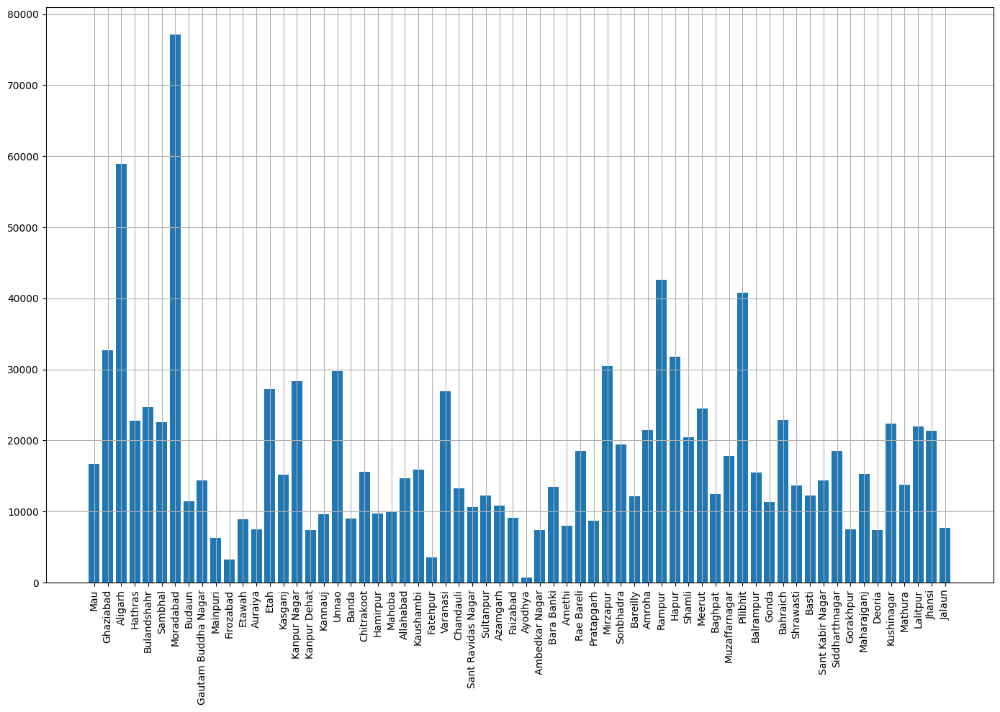

In [67]:
plt.figure(figsize=(14, 10))
plt.bar(df_filtered['district'],df_filtered['total_enroll'])
plt.xticks(rotation=90)
plt.grid()
plt.tight_layout()
# plt.gca().invert_yaxis()
plt.show()

In [68]:
df_up['pin_multi_district_flag'] = (
    df_up.groupby('pincode')['district']
      .transform('nunique') > 1
)


/tmp/ipykernel_14648/1365478035.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['pin_multi_district_flag'] = (


In [69]:
pin_district_map = (
    df_up[df_up['pin_multi_district_flag']]
    .groupby('pincode')['district']
    .unique()
    .reset_index()
)

In [70]:
pin_district_map

,pincode,district
0,121705,"[Mau, Azamgarh]"
1,201001,"[Ghaziabad, Hapur]"
2,201002,"[Ghaziabad, Gautam Buddha Nagar]"
3,201005,"[Ghaziabad, Hapur]"
4,201006,"[Ghaziabad, Hapur]"
...,...,...
537,284405,"[Lalitpur, Jhansi]"
538,285125,"[Jalaun, Jhansi]"
539,285126,"[Jalaun, Shrawasti]"
540,285205,"[Jhansi, Jalaun]"


In [71]:
df_up['pin_multi_district_flag'].value_counts()

pin_multi_district_flag
False    92981
True     62261
Name: count, dtype: int64

In [72]:
df_up['total_enrolment'] = df_up['bio_age_5_17'] +df_up['bio_age_17_']
df_up.head()


/tmp/ipykernel_14648/740358370.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['total_enrolment'] = df_up['bio_age_5_17'] +df_up['bio_age_17_']


,date,state,district,pincode,bio_age_5_17,bio_age_17_,state_clean,total_enrolled,pin_multi_state_flag,CTAR,...,day,FBLI,age_entropy,d_child_dt,d_adult_dt,dd_child_dt2,dd_adult_dt2,district_clean,pin_multi_district_flag,total_enrolment
21,2025-03-01,Uttar Pradesh,Bara Banki,225408,17,3,Uttar Pradesh,20,False,0.150000,...,1,0.850000,0.422709,NaN,NaN,NaN,NaN,bara banki,True,20
69,2025-03-01,Uttar Pradesh,Hardoi,241406,803,216,Uttar Pradesh,1019,False,0.211973,...,1,0.788027,0.516558,NaN,NaN,NaN,NaN,hardoi,False,1019
70,2025-03-01,Uttar Pradesh,Siddharthnagar,272205,857,272,Uttar Pradesh,1129,False,0.240921,...,1,0.759079,0.552139,NaN,NaN,NaN,NaN,siddharthnagar,False,1129
75,2025-03-01,Uttar Pradesh,Hardoi,241304,1025,328,Uttar Pradesh,1353,False,0.242424,...,1,0.757576,0.553858,222.0,112.0,NaN,NaN,hardoi,False,1353
138,2025-03-01,Uttar Pradesh,Ballia,277209,293,185,Uttar Pradesh,478,False,0.387029,...,1,0.612971,0.667401,NaN,NaN,NaN,NaN,ballia,False,478


In [73]:
# df_up month
df_up['year']=df_up['date'].dt.year
df_up['month']=df_up['date'].dt.month
df_up['day']=df_up['date'].dt.day
df_up.head()

/tmp/ipykernel_14648/2416563256.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['year']=df_up['date'].dt.year
/tmp/ipykernel_14648/2416563256.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['month']=df_up['date'].dt.month
/tmp/ipykernel_14648/2416563256.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

,date,state,district,pincode,bio_age_5_17,bio_age_17_,state_clean,total_enrolled,pin_multi_state_flag,CTAR,...,day,FBLI,age_entropy,d_child_dt,d_adult_dt,dd_child_dt2,dd_adult_dt2,district_clean,pin_multi_district_flag,total_enrolment
21,2025-03-01,Uttar Pradesh,Bara Banki,225408,17,3,Uttar Pradesh,20,False,0.150000,...,1,0.850000,0.422709,NaN,NaN,NaN,NaN,bara banki,True,20
69,2025-03-01,Uttar Pradesh,Hardoi,241406,803,216,Uttar Pradesh,1019,False,0.211973,...,1,0.788027,0.516558,NaN,NaN,NaN,NaN,hardoi,False,1019
70,2025-03-01,Uttar Pradesh,Siddharthnagar,272205,857,272,Uttar Pradesh,1129,False,0.240921,...,1,0.759079,0.552139,NaN,NaN,NaN,NaN,siddharthnagar,False,1129
75,2025-03-01,Uttar Pradesh,Hardoi,241304,1025,328,Uttar Pradesh,1353,False,0.242424,...,1,0.757576,0.553858,222.0,112.0,NaN,NaN,hardoi,False,1353
138,2025-03-01,Uttar Pradesh,Ballia,277209,293,185,Uttar Pradesh,478,False,0.387029,...,1,0.612971,0.667401,NaN,NaN,NaN,NaN,ballia,False,478


In [74]:
df_up_lavel = df_up.groupby('district')[['bio_age_5_17','bio_age_17_','total_enrolment']].sum()
df_up_lavel.shape

(90, 3)

In [75]:
df_up_lavel

,bio_age_5_17,bio_age_17_,total_enrolment
district,,,
Agra,152308,82740,235048
Aligarh,144160,55340,199500
Allahabad,177827,81083,258910
Ambedkar Nagar,53320,33900,87220
Amethi,57942,35329,93271
...,...,...,...
Sitapur,200310,64001,264311
Sonbhadra,72009,31746,103755
Sultanpur,60800,37665,98465


In [76]:
df_up_lavel=df_up_lavel.sort_values('total_enrolment',ascending=False).reset_index()
df_up_lavel

,district,bio_age_5_17,bio_age_17_,total_enrolment
0,Sitapur,200310,64001,264311
1,Allahabad,177827,81083,258910
2,Agra,152308,82740,235048
3,Bareilly,166397,68411,234808
4,Lucknow,123838,93552,217390
...,...,...,...,...
85,Bagpat,2,6,8
86,Gautam Buddha Nagar *,0,2,2
87,Chandauli *,0,1,1
88,Mahoba *,0,1,1


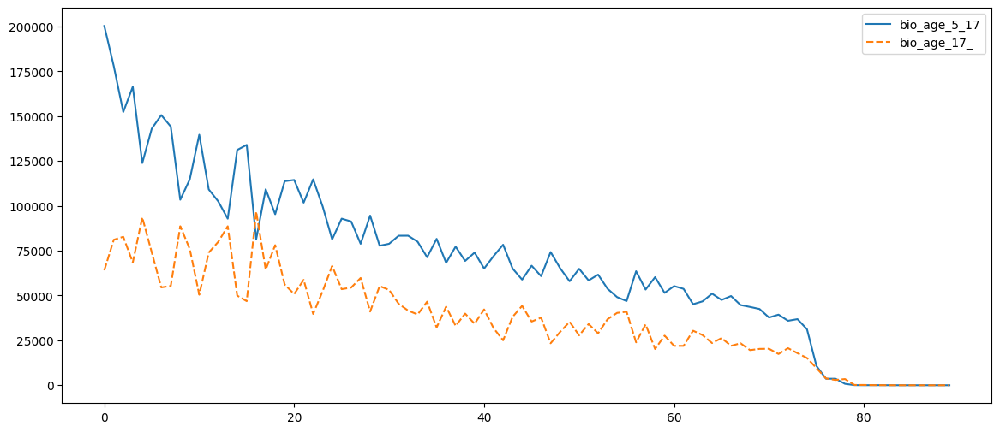

In [77]:
plt.figure(figsize=(14, 6))   # width, height in inches
sns.lineplot(data=df_up_lavel[['bio_age_5_17','bio_age_17_']])
plt.show()

In [78]:
df_up_lavel_pin=df_up.groupby('pincode')[['bio_age_5_17','bio_age_17_','total_enrolment']].sum()
df_up_lavel_pin.shape

(1753, 3)

In [79]:
df_up_lavel_pin=df_up_lavel_pin.sort_values('total_enrolment',ascending=False).reset_index()
df_up_lavel_pin

,pincode,bio_age_5_17,bio_age_17_,total_enrolment
0,244001,45240,31883,77123
1,247001,31809,29608,61417
2,202001,37297,21747,59044
3,283203,35859,14463,50322
4,250002,24895,18874,43769
...,...,...,...,...
1748,232115,0,1,1
1749,210010,1,0,1
1750,227132,1,0,1
1751,231224,0,1,1


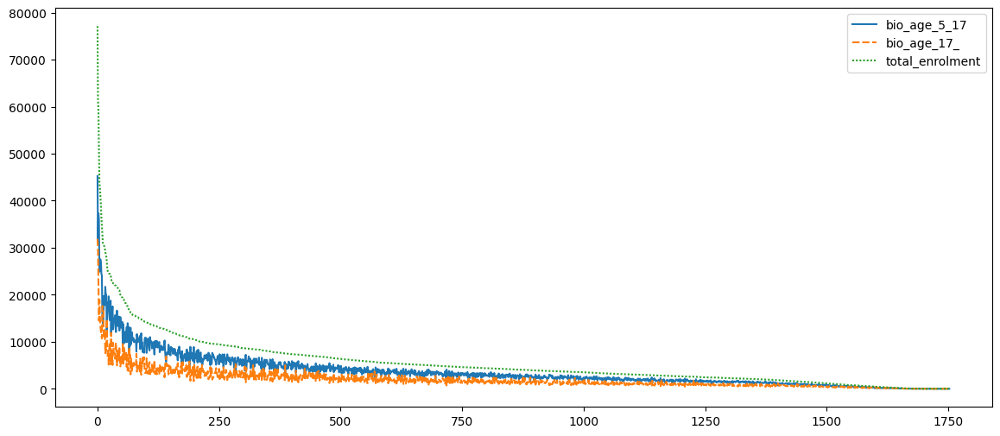

In [80]:
plt.figure(figsize=(14, 6))   # width, height in inches
sns.lineplot(data=df_up_lavel_pin[['bio_age_5_17','bio_age_17_','total_enrolment']])
plt.show()

In [81]:
df_up_month_enroll=df_up.groupby('month')[['bio_age_5_17','bio_age_17_','total_enrolment']].sum()
df_up_month_enroll

,bio_age_5_17,bio_age_17_,total_enrolment
month,,,
3,746862,384642,1131504
4,859000,398448,1257448
5,703440,345438,1048878
6,522937,333518,856455
7,902096,523905,1426001
9,739376,287151,1026527
10,368471,208409,576880
11,699396,398480,1097876
12,665527,490639,1156166


<Axes: xlabel='month'>

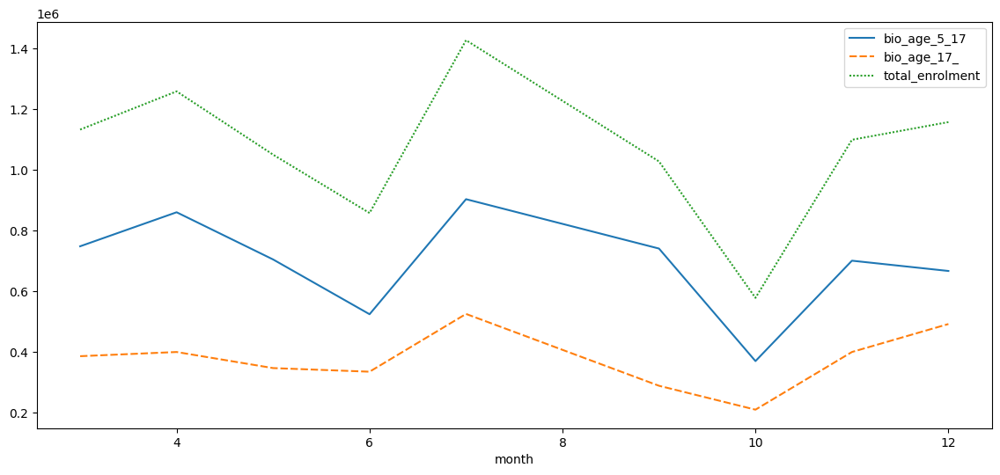

In [82]:
plt.figure(figsize=(14, 6))   # width, height in inches
sns.lineplot(data=df_up_month_enroll[['bio_age_5_17','bio_age_17_','total_enrolment']])

#### Child to Adult Ratio

In [83]:
df_up.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'state_clean', 'total_enrolled', 'pin_multi_state_flag', 'CTAR',
       'log_CTAR', 'year', 'month', 'day', 'FBLI', 'age_entropy', 'd_child_dt',
       'd_adult_dt', 'dd_child_dt2', 'dd_adult_dt2', 'district_clean',
       'pin_multi_district_flag', 'total_enrolment'],
      dtype='object')

In [84]:
# Imbalance
df_up['CTAR']=df_up['bio_age_17_']/df_up['total_enrolment'].replace(0,np.nan)
# Imbalance
df_up['log_CTAR']=np.log(df_up['CTAR'].replace(0,np.nan))

/tmp/ipykernel_14648/221947052.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['CTAR']=df_up['bio_age_17_']/df_up['total_enrolment'].replace(0,np.nan)
/tmp/ipykernel_14648/221947052.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['log_CTAR']=np.log(df_up['CTAR'].replace(0,np.nan))


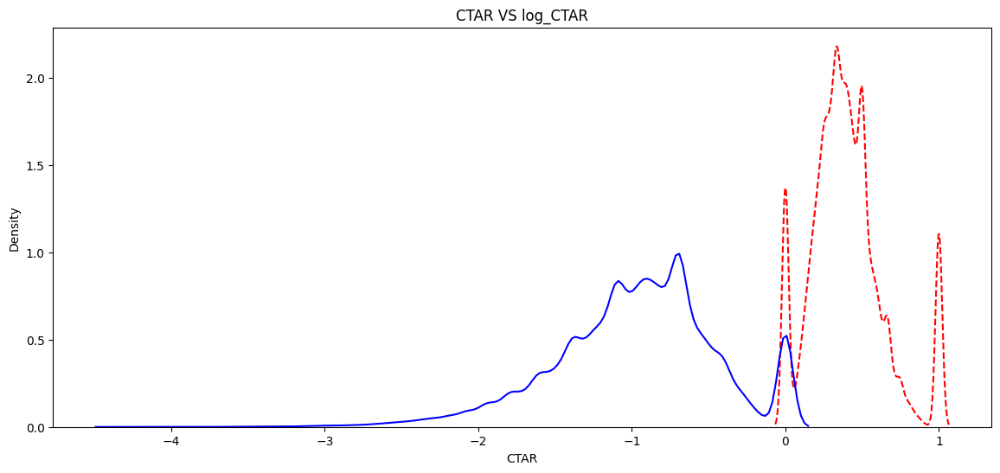

In [85]:
plt.figure(figsize=(14, 6))
sns.kdeplot(x='CTAR',data=df_up,ls='--',color='red',label='CTAR')

sns.kdeplot(x='log_CTAR',data=df_up,color='blue',label='log_CTAR')
plt.title('CTAR VS log_CTAR')
plt.show()

In [86]:
#Future Biometric Load Index (FBLI), delayed biometric stress
df_up['FBLI']=df_up['bio_age_5_17']/df_up['total_enrolment']

/tmp/ipykernel_14648/2708028338.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up['FBLI']=df_up['bio_age_5_17']/df_up['total_enrolment']


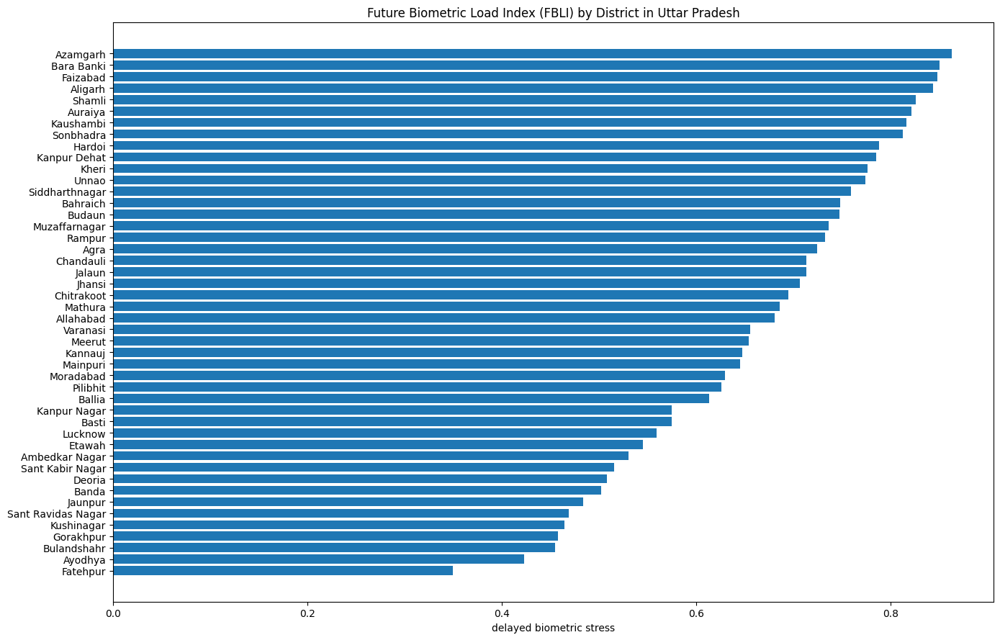

In [87]:
top = df_up.head(80).sort_values('FBLI',ascending=False)

plt.figure(figsize=(14, 9))
plt.barh(top['district'], top['FBLI'])
plt.xlabel("delayed biometric stress")
plt.title("Future Biometric Load Index (FBLI) by District in Uttar Pradesh")
plt.tight_layout()
plt.gca().invert_yaxis()
plt.show()

#### univariant intelligence(not for plots for sake)
Key questions you must answer in words:

Is CAR skewed or symmetric?

Are there extreme FBLI outliers?

Which variable carries the most variance?

In [88]:
df_up[['bio_age_5_17','bio_age_17_','total_enrolment','CTAR','FBLI']].describe()

,bio_age_5_17,bio_age_17_,total_enrolment,CTAR,FBLI
count,155242.000000,155242.000000,155242.000000,155240.000000,155240.000000
mean,39.983413,21.712101,61.695514,0.397360,0.602640
std,153.393263,82.076029,228.365655,0.237257,0.237257
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,2.000000,6.000000,0.250000,0.500000
50%,11.000000,6.000000,18.000000,0.375000,0.625000
75%,25.000000,14.000000,39.000000,0.500000,0.750000
max,8002.000000,4980.000000,11612.000000,1.000000,1.000000


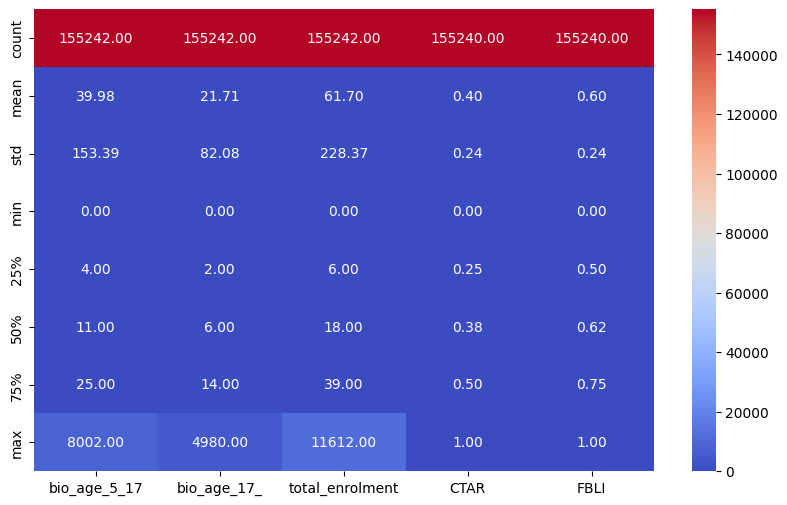

In [89]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_up[['bio_age_5_17','bio_age_17_','total_enrolment','CTAR','FBLI']].describe(), annot=True, fmt=".2f", cmap="coolwarm")
plt.show()

#### Temporal signals(Societal rhythms)
Insight hunt:

Do children enrol before/after adults?

Do enrolments spike around academic cycles?

Any structural break post-policy years?

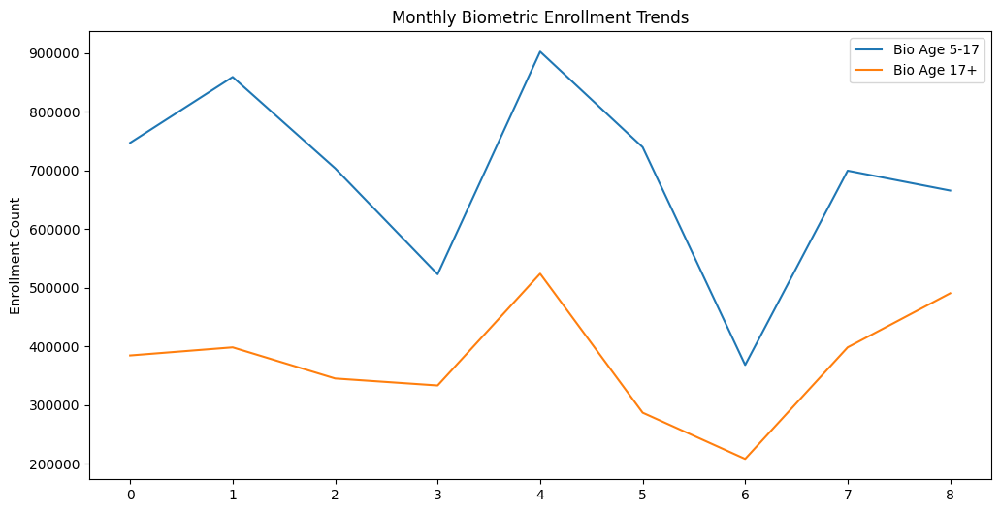

In [90]:
monthly_summary=df_up.groupby(['year','month'])[['bio_age_5_17','bio_age_17_']].sum().reset_index()
plt.figure(figsize=(12,6))
plt.plot(monthly_summary.index, monthly_summary['bio_age_5_17'], label='Bio Age 5-17')
plt.plot(monthly_summary.index, monthly_summary['bio_age_17_'], label='Bio Age 17+')

plt.ylabel('Enrollment Count')
plt.title('Monthly Biometric Enrollment Trends')
plt.legend()
plt.show()

In [91]:
district_metrics = df_up.groupby('district')[['CTAR', 'FBLI']].mean().reset_index()

district_metrics.sort_values('CTAR', ascending=False).head(10)
district_metrics.sort_values('FBLI', ascending=False).head(10)

# print("Top CTAR districts represent future biometric overload zones.")

,district,CTAR,FBLI
7,Auraiya *,0.000000,1.000000
77,Sambhal,0.288270,0.711730
81,Shahjahanpur,0.288615,0.711385
12,Bahraich,0.294903,0.705097
85,Sitapur,0.296759,0.703241
43,Hardoi,0.298531,0.701469
1,Aligarh,0.301882,0.698118
54,Kheri,0.309813,0.690187
44,Hathras,0.309965,0.690035
24,Bulandshahr,0.312945,0.687055


WHAT YOU MUST WRITE AS INSIGHTS (EXAMPLES)

“Districts with CAR > 0.8 show disproportionate child enrolment, indicating future biometric revalidation pressure.”

“Urban districts display low CAR + high adult enrolment, consistent with labor migration inflows.”

“Stable FBLI over time suggests predictable service demand; volatile FBLI signals governance blind spots.”

In [92]:
# Ensure numeric
cols=['bio_age_5_17', 'bio_age_17_']
df_up[cols]=df_up[cols].apply(pd.to_numeric, errors='coerce')

/tmp/ipykernel_14648/3068756118.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_up[cols]=df_up[cols].apply(pd.to_numeric, errors='coerce')


In [93]:
## Remove impossible valuues
df_up=df_up[(df_up['bio_age_17_']>=0)&(df_up['bio_age_5_17']>=0)]

### Entropy (Information-theoretic signal)
* **High Entropy -> Balanced resilient**
* **Low Entropy -> Fragile, skewed system**

In [94]:
def shannon_entropy(row):
    total= row['total_enrolment']
    if total == 0:
        return np.nan
    p1 = row['bio_age_5_17'] / total
    p2 = row['bio_age_17_'] / total
    probs=np.array([p1,p2])
    probs=probs[probs>0]
    return -np.sum(probs*np.log(probs))

df_up['age_entropy'] = df_up.apply(shannon_entropy, axis=1)

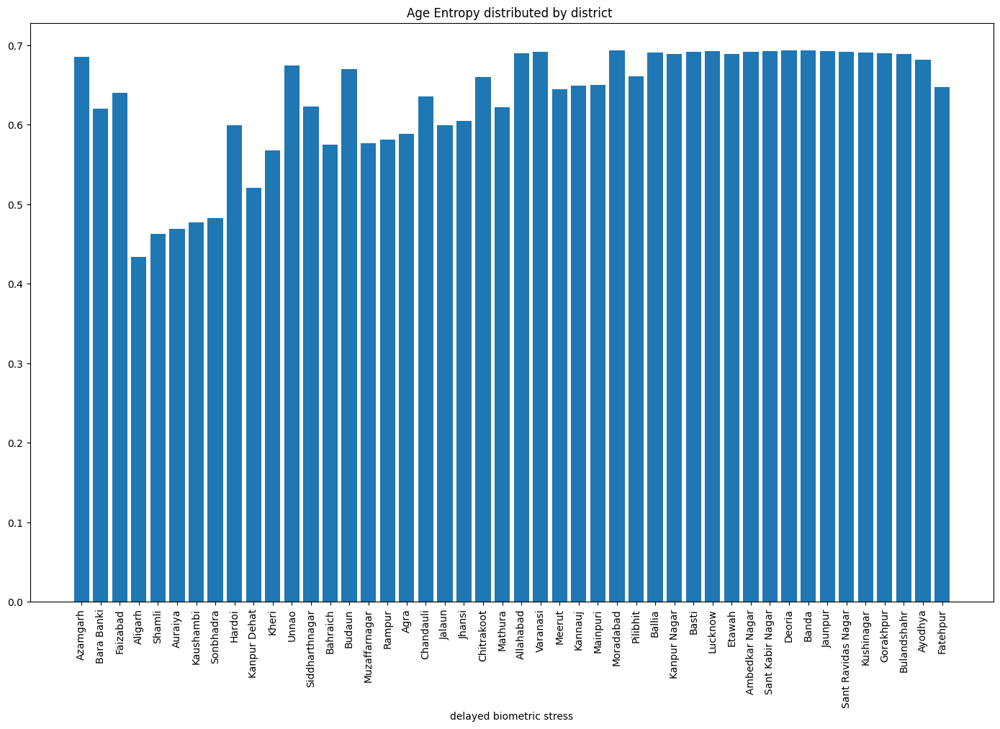

In [99]:
top1 = df_up.head(80).sort_values('age_entropy',ascending=False)

plt.figure(figsize=(14, 9))
plt.bar(top['district'], top['age_entropy'])
plt.xlabel("delayed biometric stress")
plt.title("Age Entropy distributed by district ")
plt.tight_layout()
plt.xticks(rotation=90)
# plt.gca().invert_yaxis()
plt.show()

### Discrete Calculus
* **Acceleration predict failure ealrier than volume**

In [95]:
df_up = df_up.sort_values(['state', 'district'])

#### First Derivative (velocity)

In [96]:
df_up['d_child_dt']=df_up.groupby('district')['bio_age_5_17'].diff()
df_up['d_adult_dt']=df_up.groupby('district')['bio_age_17_'].diff()


#### Second Order Derivative

In [98]:
df_up['dd_child_dt2']=df_up.groupby('district')['d_child_dt'].diff()
df_up['dd_adult_dt2']=df_up.groupby('district')['d_adult_dt'].diff()

### Volatility & Instability 
* **High volatility = uncertainty in governance demand**

In [101]:
# Rolling volatility (std dev over 3 time periods)
df_up['child_volatility'] =(
    df_up.groupby('district')['bio_age_5_17'].rolling(3).std().reset_index(level=0, drop=True)
    
)

In [102]:
df_up['adult_volatility'] =(
    df_up.groupby('district')['bio_age_17_'].rolling(3).std().reset_index(level=0, drop=True)
    
)

### Normalization (For comparability)

In [103]:
from scipy.stats import zscore

norm_cols=['CTAR','FBLI','age_entropy',
           'd_child_dt','d_adult_dt',
           'dd_child_dt2','dd_adult_dt2',
           'child_volatility','adult_volatility'
]

for i in norm_cols:
    df_up[f'z_{i}']=df_up.groupby('state')[i].transform(
        lambda x: zscore(x, nan_policy='omit')
    )

### System Stress Flags (Decision)
* **Early-Warning Signal**

In [104]:
df_up['future_stress_flag'] =(
    (df_up['z_CTAR']>1.5) &
    (df_up['z_FBLI']>1.0) &
    (df_up['z_age_entropy']< -1) &
    (df_up['age_entropy']<df_up['age_entropy'].quantile(0.25))
).astype(int)

### Aggregated Intelligence table (what  actually use)
* **Rank districts**
* **Guide capacity planning**


In [105]:
district_intel=df_up.groupby('district').agg(
    mean_CTAR=('CTAR','mean'),
    mean_FBLI=('FBLI','mean'),
    stress_events=('future_stress_flag','sum'),
    mean_age_entropy=('age_entropy','mean'),
    avg_child_acceletation=('dd_child_dt2','mean'),
    
).reset_index().sort_values('stress_events', ascending=False)

In [110]:
district_intel['avg_child_acceletation']<False

0      True
67     True
65    False
64    False
63     True
      ...  
28     True
27    False
26    False
25    False
89     True
Name: avg_child_acceletation, Length: 90, dtype: bool

### Temporal consistency validation
* **Prove signals persist over time**

In [105]:
years=sorted(df_up['year'].dropna().unique())
n =len(years)
n

1

In [106]:
early_years=years[:n//3]
mid_years=years[n//3:2*n//3]
late_years=years[2*n//3:]

In [107]:
df_up.columns

Index(['date', 'state', 'district', 'pincode', 'bio_age_5_17', 'bio_age_17_',
       'state_clean', 'total_enrolled', 'pin_multi_state_flag', 'CTAR',
       'log_CTAR', 'FBLI', 'year', 'month', 'day', 'age_entropy', 'd_child_dt',
       'd_adult_dt', 'dd_child_dt2', 'dd_adult_dt2', 'district_clean',
       'pin_multi_district_flag', 'total_enrolment', 'child_volatility',
       'adult_volatility', 'z_CTAR', 'z_FBLI', 'z_age_entropy', 'z_d_child_dt',
       'z_d_adult_dt', 'z_dd_child_dt2', 'z_dd_adult_dt2',
       'z_child_volatility', 'z_adult_volatility', 'future_stress_flag'],
      dtype='object')

In [108]:
## Recompute district metrics for each period
def district_summary(data):
    return (
        data.groupby('district').agg(
            mean_CTAR=('CTAR','mean'),
            mean_FBLI=('FBLI','mean'),
            mean_entropy=('age_entropy','mean'),
            mean_accel=('dd_child_dt2','mean'),
        ).reset_index()
    )

In [109]:
early = district_summary(df_up[df_up['year'].isin(early_years)])
mid = district_summary(df_up[df_up['year'].isin(mid_years)])
late = district_summary(df_up[df_up['year'].isin(late_years)])

In [110]:
## Rank stability check
from scipy.stats import spearmanr
marged=early.merge(late, on='district', suffixes=('_early','_late'))
rho, p = spearmanr(
    marged['mean_CTAR_early'],
    marged['mean_CTAR_late']
)
rho, p

(nan, nan)

### Internal Contradiction Check

In [111]:
## Define strong signals conditions
df_up['multi_signal_flag'] = (
    (df_up['z_CTAR']>1.5).astype(int) +
    (df_up['z_dd_child_dt2']>1.5).astype(int) +
    (df_up['age_entropy']<df_up['age_entropy'].quantile(0.25)).astype(int)
)

In [112]:
### check agreement strength
# Rule

# avg_signal_score ≥ 2 → structural condition

# =1 → weak / incidental

# <1 → noise

signal_strength=(
    df_up.groupby('district')['multi_signal_flag'].mean().reset_index(name="avg_signal_score").sort_values('avg_signal_score', ascending=False)
)
signal_strength.head(20)

,district,avg_signal_score
36,Gautam Buddha Nagar *,2.000000
61,Mahoba *,2.000000
26,Chandauli *,2.000000
48,Jyotiba Phule Nagar,1.846774
74,Raebareli,1.666667
62,Mahrajganj,1.619048
11,Bagpat,1.571429
23,Bulandshahar,1.522876
80,Sant Ravidas Nagar Bhadohi,1.489130
17,Barabanki,1.445137


In [113]:
signal_strength[signal_strength['avg_signal_score']<1]

,district,avg_signal_score
8,Ayodhya,0.957850
20,Bhadohi,0.702509
42,Hapur,0.690254
72,Prayagraj,0.686727
24,Bulandshahr,0.493011
...,...,...
14,Balrampur,0.190158
78,Sant Kabir Nagar,0.186658
28,Deoria,0.170425
59,Maharajganj,0.151163


### Scale Robustness check

In [114]:
## state-normalized vs raw CAR
raw_rank= (
    df_up.groupby('district')['CTAR'].mean().rank(ascending=False)
    )
norm_rank= (
    df_up.groupby('district')['z_CTAR'].mean().rank(ascending=False)
    )

rho_scale, p_scale = spearmanr(raw_rank, norm_rank,nan_policy='omit')
rho_scale, p_scale

(1.0, 0.0)

### Threshold sensitivity test
* Large intersection → threshold-independent insight

* Small intersection → fragile logic (fix before proceeding)

In [115]:
threshold=[1.2,1.5,2.0]
results ={}
for th in threshold:
    results[th]=set(
        df_up[df_up['CTAR']>th]['district']
    )
    
# Intersections
intersection = set.intersection(*results.values())
intersection, len(intersection)

(set(), 0)

### Null model 
* Prove structure != randomness

In [116]:
## Shuffle test for significance of rank correlation
np.random.seed(42)
df_null = df_up.copy()
df_null['bio_age_5_17']=np.random.permutation(df_null['bio_age_5_17'].values)
df_null['bio_age_17_']=np.random.permutation(df_null['bio_age_17_'].values)

df_null['CAR_null'] = (
    df_null['bio_age_17_'] / df_null['total_enrolment'].replace(0,np.nan)
)

In [117]:
## Compare Distributions
# Interpretation

# real_var ≫ null_var → non-random structure exists

# Similar values → signal questionable

real_var=df_up['CTAR'].var()
null_var=df_null['CAR_null'].var()
real_var, null_var

(0.05629074769533017, 827.5464087776111)

In [118]:
validated_districts = (
    signal_strength.merge(
        district_intel,on='district')
    .sort_values(['avg_signal_score','stress_events'], ascending=False)
)
validated_districts.head(10)

,district,avg_signal_score,mean_CTAR,mean_FBLI,stress_events,mean_age_entropy,avg_child_acceletation
0,Gautam Buddha Nagar *,2.000000,1.000000,0.000000,0,0.000000,NaN
1,Mahoba *,2.000000,1.000000,0.000000,0,0.000000,NaN
2,Chandauli *,2.000000,1.000000,0.000000,0,0.000000,NaN
3,Jyotiba Phule Nagar,1.846774,0.881720,0.118280,0,0.020403,0.000000
4,Raebareli,1.666667,0.666667,0.333333,0,0.000000,0.000000
5,Mahrajganj,1.619048,0.619048,0.380952,0,0.000000,-0.052632
6,Bagpat,1.571429,0.785714,0.214286,0,0.099021,0.200000
7,Bulandshahar,1.522876,0.722331,0.277669,0,0.085137,0.013245
8,Sant Ravidas Nagar Bhadohi,1.489130,0.586957,0.413043,0,0.045205,0.011111
9,Barabanki,1.445137,0.801403,0.198597,0,0.174065,0.008750


### EDA 

#### Stress rank stability
* RISK concentration is persistent

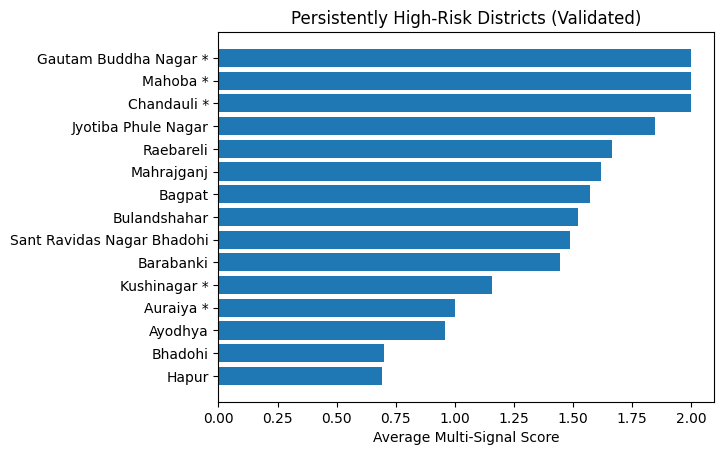

In [119]:
import matplotlib.pyplot as plt

top = validated_districts.head(15)

plt.figure()
plt.barh(top['district'], top['avg_signal_score'])
plt.xlabel("Average Multi-Signal Score")
plt.title("Persistently High-Risk Districts (Validated)")
plt.gca().invert_yaxis()
plt.show()


In [120]:
len(validated_districts)

90

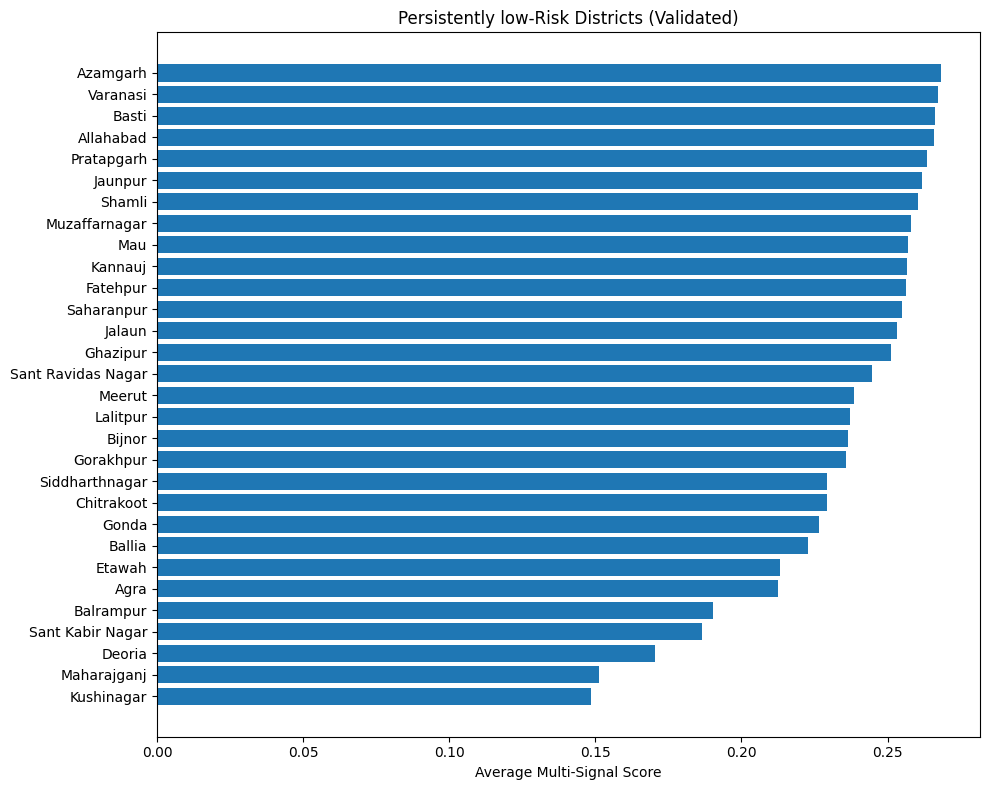

In [121]:
tail = validated_districts.tail(30)

plt.figure(figsize=(10,8))
plt.barh(tail['district'], tail['avg_signal_score'])
plt.xlabel("Average Multi-Signal Score")
plt.title("Persistently low-Risk Districts (Validated)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

#### Age Imbalance map
* A small fraction of districts carry disproportionate future load

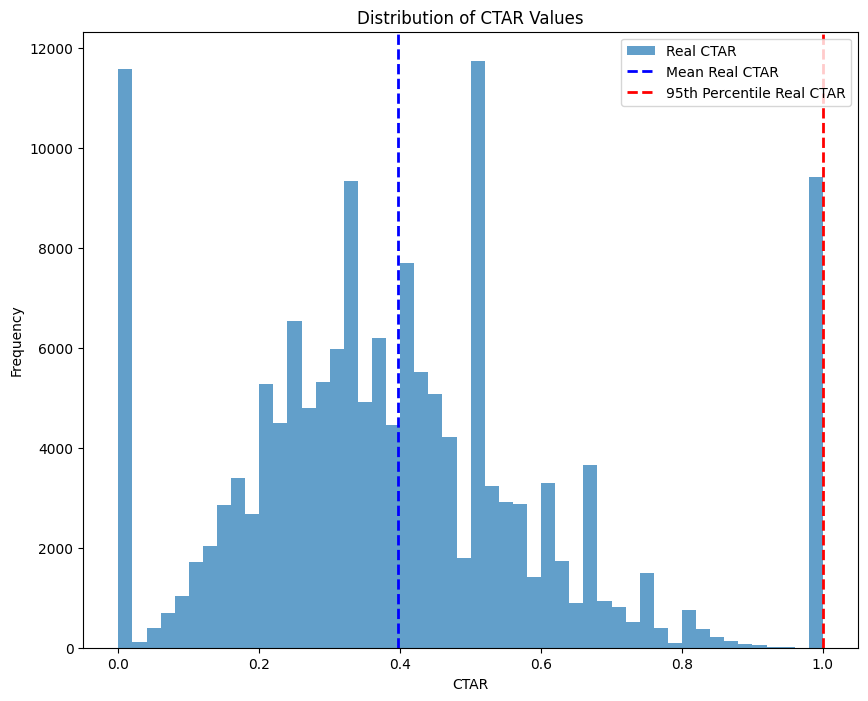

In [122]:
plt.figure(figsize=(10,8))
plt.hist(df_up['CTAR'], bins=50, alpha=0.7, label='Real CTAR')
plt.axvline(df_up['CTAR'].mean(), color='blue', linestyle='dashed', linewidth=2, label='Mean Real CTAR')
plt.axvline(df_up['CTAR'].quantile(0.95), color='red', linestyle='dashed', linewidth=2, label='95th Percentile Real CTAR')
plt.title("Distribution of CTAR Values")
plt.xlabel("CTAR")
plt.ylabel("Frequency")
plt.legend()
plt.show()

#### Acceleration VS Entropy
* Failure risk is driven by dynamics and imbalance, not volume

/tmp/ipykernel_8114/576740994.py:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(


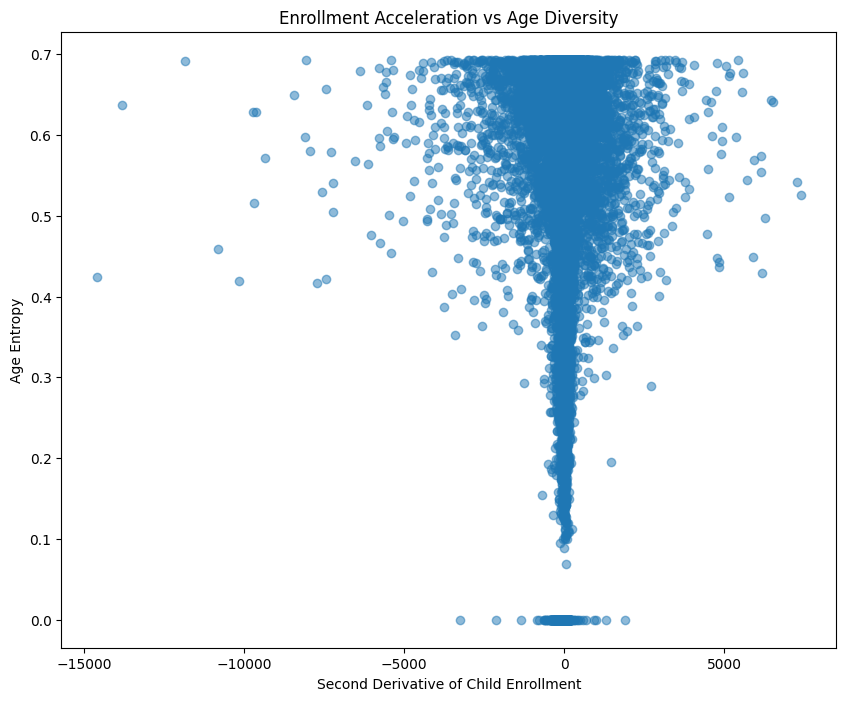

In [123]:
sample = df_up.dropna(subset=['dd_child_dt2','age_entropy'])

plt.figure(figsize=(10,8))
plt.scatter(
    sample['dd_child_dt2'],
    sample['age_entropy'],
   alpha=0.5,
   cmap='viridis'
)
plt.xlabel("Second Derivative of Child Enrollment")
plt.ylabel("Age Entropy")
plt.title("Enrollment Acceleration vs Age Diversity")
plt.show()

#### Decision Cut
* This define whare practive capacity must be deployed

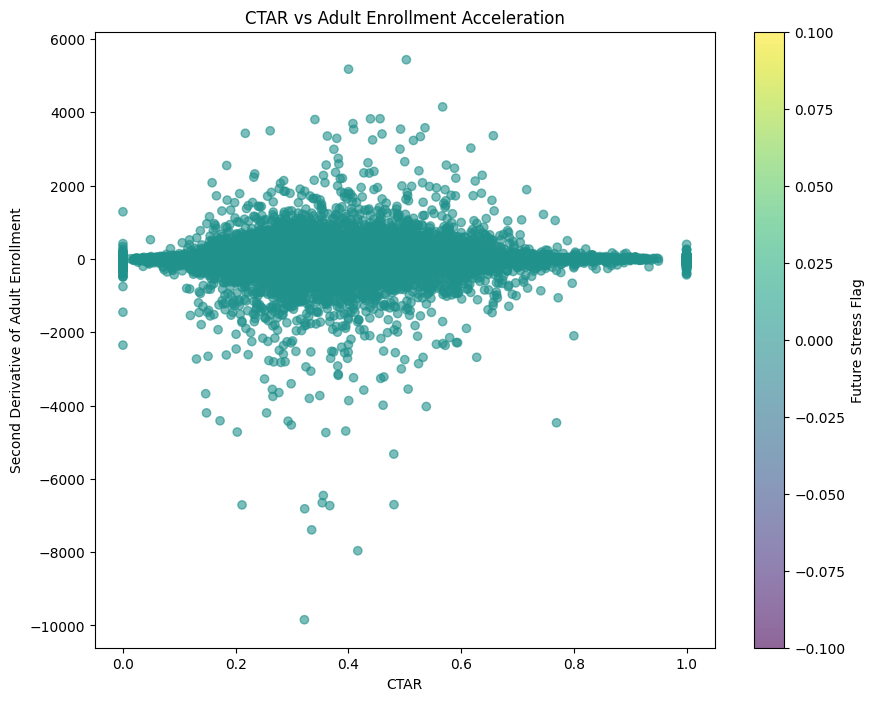

In [124]:
plt.figure(figsize=(10,8))
plt.scatter(df_up['CTAR'],df_up['dd_adult_dt2'],c=df_up['future_stress_flag'], cmap='viridis', alpha=0.6)
plt.colorbar(label='Future Stress Flag')
plt.xlabel("CTAR")
plt.ylabel("Second Derivative of Adult Enrollment")
plt.title("CTAR vs Adult Enrollment Acceleration")
plt.show()

#### Distribution Intelligence

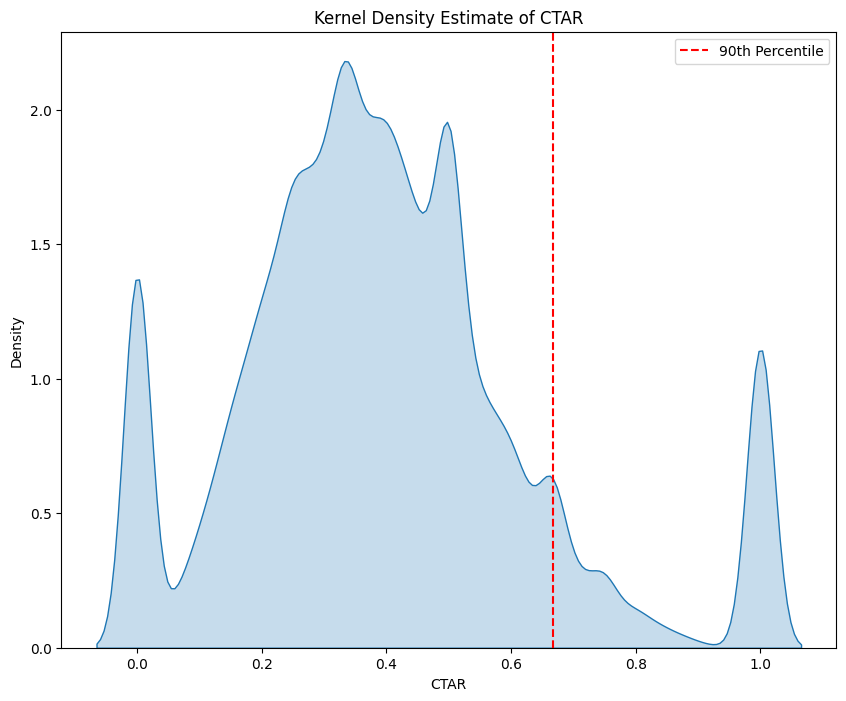

In [125]:
plt.figure(figsize=(10,8))
sns.kdeplot(df_up['CTAR'].dropna(),fill=True)
plt.axvline(df_up['CTAR'].quantile(0.9),ls='--', color='red', label='90th Percentile')
plt.title("Kernel Density Estimate of CTAR")
plt.xlabel("CTAR")
plt.ylabel("Density")
plt.legend()
plt.show()

#### Strucural Contrast

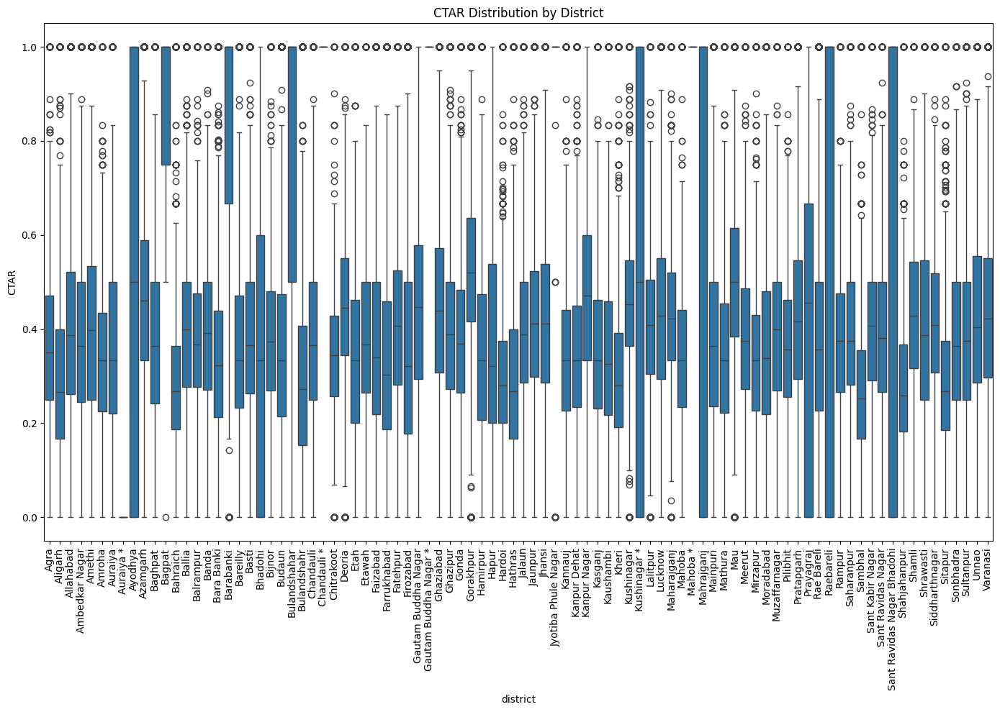

In [126]:
plt.figure(figsize=(14,10))
sns.boxplot(x='district',y='CTAR', data=df_up)
plt.xticks(rotation=90)
plt.title("CTAR Distribution by District")
plt.tight_layout()
plt.show()

#### Dynamics, Fragility
* Bottom-right = high acceleration + low entropy
→ highest failure risk

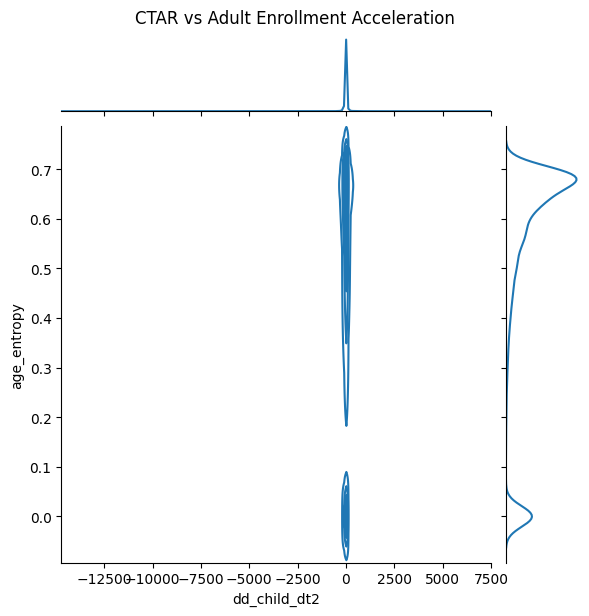

In [127]:
sns.jointplot(
    data=df_up.dropna(subset=['dd_child_dt2','age_entropy']),
    x='dd_child_dt2',
    y='age_entropy',
    kind='kde'
)
plt.suptitle("CTAR vs Adult Enrollment Acceleration",y=1.02)
plt.show()

#### Multi- signal Interaction
* Hover = district-level intelligence

* Color = fragility

* Axes = pressure & acceleration

In [128]:
import plotly.express as px
plt.figure(figsize=(14,12))
fig = px.scatter(
    df_up.dropna(subset=['CTAR','dd_child_dt2','age_entropy']),
    x='CTAR',
    y='dd_child_dt2',
    color='age_entropy',
    hover_name='district',
    color_continuous_scale='RdYlBu_r',
    title="Interactive System Stress Map"
)
fig.show()


/home/sheshpalsingh/anaconda3/envs/myenv/lib/python3.10/site-packages/kaleido/_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




<Figure size 1400x1200 with 0 Axes>

In [129]:
temporal = (
    df_up.groupby(['month','year'])
      .agg(mean_CTAR=('CTAR','mean'),
           mean_FBLI=('FBLI','mean'))
      .reset_index()
)

fig = px.line(
    temporal,
    x='month',
    y=['mean_CTAR','mean_FBLI'],
    title="Temporal Evolution of Future Pressure Signals"
)
fig.show()


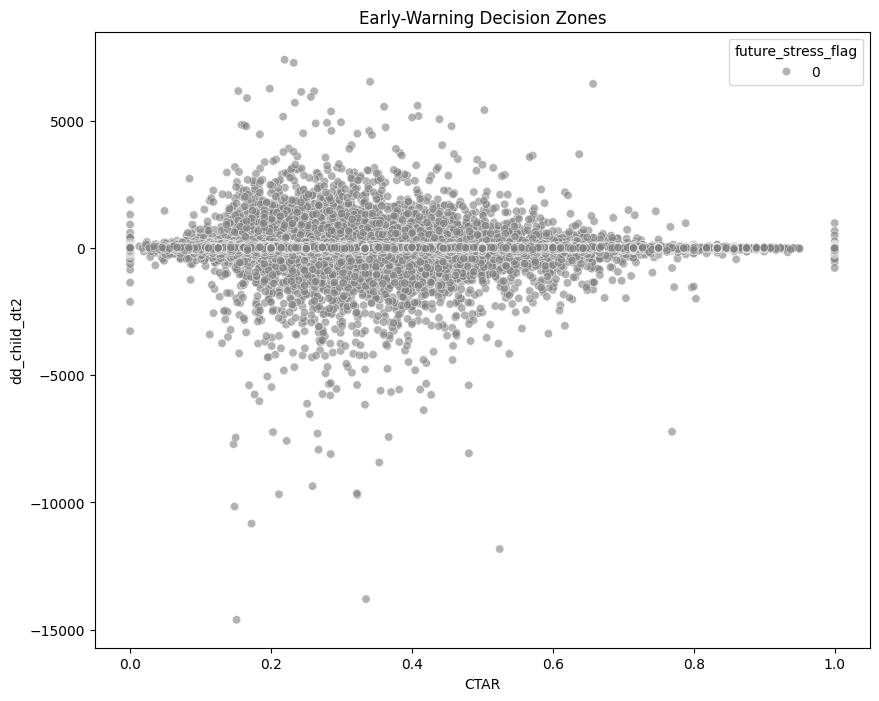

In [130]:
plt.figure(figsize=(10,8))
sns.scatterplot(
    data=df_up,
    x='CTAR',
    y='dd_child_dt2',
    hue='future_stress_flag',
    palette={0:'grey',1:'red'},
    alpha=0.6
)
plt.title("Early-Warning Decision Zones")
plt.show()
